In [1]:
import json
import h5py
import tqdm
import datetime
import time
import pandas as pd
import numpy as np

import importlib
import sys
sys.path.insert(0, '/cndd/fangming/CEMBA/snmcseq_dev')
sys.path.insert(0, '/cndd2/fangming/projects/SingleCellRoutines')

import __init__plots
importlib.reload(__init__plots)
from __init__plots import *

import snmcseq_utils
importlib.reload(snmcseq_utils)

import utils
importlib.reload(utils)

<module 'utils' from '/cndd2/fangming/projects/SingleCellRoutines/utils.py'>

In [2]:
today = datetime.date.today()
figures = '../figures/{}_{{}}'.format(today)
figures

'../figures/2021-05-20_{}'

# read in processed data

In [3]:
# palette as json
file = '../data/palette.json'
with open(file, 'r') as f:
    palette = json.load(f)
palette

{'Slice1_Replicate1': [0.19215686274509805,
  0.5098039215686274,
  0.7411764705882353],
 'Slice1_Replicate2': [0.4196078431372549,
  0.6823529411764706,
  0.8392156862745098],
 'Slice1_Replicate3': [0.6196078431372549,
  0.792156862745098,
  0.8823529411764706],
 'Slice2_Replicate1': [0.9019607843137255,
  0.3333333333333333,
  0.050980392156862744],
 'Slice2_Replicate2': [0.9921568627450981,
  0.5529411764705883,
  0.23529411764705882],
 'Slice2_Replicate3': [0.9921568627450981,
  0.6823529411764706,
  0.4196078431372549],
 'Slice3_Replicate1': [0.19215686274509805,
  0.6392156862745098,
  0.32941176470588235],
 'Slice3_Replicate2': [0.4549019607843137,
  0.7686274509803922,
  0.4627450980392157],
 'Slice3_Replicate3': [0.6313725490196078,
  0.8509803921568627,
  0.6078431372549019]}

In [4]:
f = '../data/clustering_embedding_Slice1_Replicate2_2021-05-18.tsv.gz'
clsts = pd.read_csv(f, sep='\t').set_index('cell')
print(clsts.shape)
clsts.head()

(88884, 3)


,cluster,umap_1,umap_2
cell,,,
277373730858255322904479591336292143718,C16,8.702812,5.932820
117900656513013109110817996947241058031,C16,7.721728,6.301687
119333730231915057163542815281040528900,C16,7.522497,5.271422
19121371109789278813978440299452537201,C16,7.461186,6.532849
234840944297164882927021967374562516131,C16,7.453898,6.215057


In [5]:
file = '../data/processed_vizgen_merfish_may1_2021.h5ad'
samples = [
#     'Slice1_Replicate1',
    'Slice1_Replicate2',
#     'Slice1_Replicate3',
    
#     'Slice2_Replicate1',
#     'Slice2_Replicate2',
#     'Slice2_Replicate3',
    
#     'Slice3_Replicate1',
#     'Slice3_Replicate2',
#     'Slice3_Replicate3',
]


data = {}
for sample in samples:
    thedata = pd.read_hdf(file, 'data_'+sample)
    data[sample] = thedata 
    

In [6]:
# informations
thedata = clsts.join(thedata) #.join(clsts)
metacols = thedata.columns[:14]
genes = thedata.columns[14:]
gmat = thedata.iloc[:,14:]
print(metacols, len(genes), gmat.shape)

Index(['cluster', 'umap_1', 'umap_2', 'x', 'y', 'fov', 'volume', 'center_x',
       'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'cell_cov'],
      dtype='object') 483 (88884, 483)


# plotting functions

In [7]:
def plot_umap_routine(ax, x, y, hue, toplot, palette=None, legend=False, title='', fontsize=12):
    """
    """
    sns.scatterplot(x=x, y=y, hue=hue, data=toplot, 
                    hue_order=np.sort(toplot[hue].unique()),
                    palette=palette,
                    s=2, 
                    alpha=0.9,
                    linewidth=0, 
                    rasterized=True, 
                    legend=legend, 
                    ax=ax,
                   )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title)

    # arrows
    ax.arrow(0.01, 0.01, 0, 0.1,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.arrow(0.01, 0.01, 0.1, 0,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.text(0.01, 0, 'UMAP', 
            transform=ax.transAxes,
            va='top', ha='left', fontsize=fontsize)
    # # arrows
    return 

def plot_spatial_routine(ax, x, y, hue, toplot, palette=None, legend=False, title='', fontsize=12):
    """
    """
    sns.scatterplot(x=x, y=y, hue=hue, data=toplot, 
                    hue_order=np.sort(toplot[hue].unique()),
                    palette=palette,
                    s=2, 
                    alpha=0.9,
                    linewidth=0, 
                    rasterized=True, 
                    legend=legend, 
                    ax=ax,
                   )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title)
    
    # arrows
    ax.arrow(0.01, 0.01, 0, 0.1,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.arrow(0.01, 0.01, 0.1, 0,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.text(0.01, 0, 'In situ', 
            transform=ax.transAxes,
            va='top', ha='left', fontsize=fontsize)
    # end arrows
    
    # scale bar
    length = 1000
    left = 3500
    length, left = 1000, 3500 
    ax.hlines(0.01, left, left+length, color='k', linewidth=3, 
              transform=ax.get_xaxis_transform())
    ax.text(left+length, 0, '1 mm', 
            va='top', ha='right', 
            transform=ax.get_xaxis_transform(),
            fontsize=fontsize)
    # end scale bar
    return



In [8]:
def plot_continuous_umap_routine(
    ax, x, y, hue, toplot, vmaxp=99, palette=None, title='', fontsize=12, pth=50):
    """
    # colorbar
    norm = plt.Normalize(0, vmaxp)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm,)
    fig.colorbar(sm, cax=cax, label='Percentile', ticks=[0, vmaxp])
    """
    vmin, vmax = 0, np.percentile(toplot[hue], vmaxp)
    cmap = sns.cubehelix_palette(as_cmap=True)
    pth = np.percentile(toplot[hue], pth)
    
    sns.scatterplot(x=x, y=y, hue=hue, data=toplot, 
                    s=1, 
                    alpha=0.3,
                    linewidth=0, 
                    legend=False, 
                    rasterized=True, 
                    vmin=vmin, 
                    vmax=vmax,
                    palette=cmap,
                    ax=ax,
                   )
    g = sns.scatterplot(x=x, y=y, hue=hue, data=toplot[toplot[hue]>pth], 
                        s=3, 
                        alpha=1,
                        linewidth=0, 
                        legend=False,
                        rasterized=True, 
                        vmin=vmin, 
                        vmax=vmax,
                        palette=cmap,
                        ax=ax,
                       )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title)

    # arrows
    ax.arrow(0.01, 0.01, 0, 0.1,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.arrow(0.01, 0.01, 0.1, 0,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.text(0.01, 0, 'UMAP', 
            transform=ax.transAxes,
            va='top', ha='left', fontsize=fontsize)
    # # arrows
    return 

def plot_continuous_spatial_routine(
    ax, x, y, hue, toplot, vmaxp=99, palette=None, title='', fontsize=12):
    """
    # colorbar
    norm = plt.Normalize(0, vmaxp)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm,)
    fig.colorbar(sm, cax=cax, label='Percentile', ticks=[0, vmaxp])
    """
    vmin, vmax = 0, np.percentile(toplot[hue], vmaxp)
    cmap = sns.cubehelix_palette(as_cmap=True)
    
    sns.scatterplot(x=x, y=y, hue=hue, data=toplot, 
                    s=1, 
                    alpha=0.3,
                    linewidth=0, 
                    legend=False, 
                    rasterized=True, 
                    vmin=vmin, 
                    vmax=vmax,
                    palette=cmap,
                    ax=ax,
                   )
    g = sns.scatterplot(x=x, y=y, hue=hue, data=toplot[toplot[hue]>0], 
                        s=3, 
                        alpha=1,
                        linewidth=0, 
                        legend=False,
                        rasterized=True, 
                        vmin=vmin, 
                        vmax=vmax,
                        palette=cmap,
                        ax=ax,
                       )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title)
    
    # arrows
    ax.arrow(0.01, 0.01, 0, 0.1,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.arrow(0.01, 0.01, 0.1, 0,
             transform=ax.transAxes,
             head_width=0.01, head_length=0.01, fc='k', ec='k')
    ax.text(0.01, 0, 'In situ', 
            transform=ax.transAxes,
            va='top', ha='left', fontsize=fontsize)
    # end arrows
    
    # scale bar
    length = 1000
    left = 3500
    length, left = 1000, 3500 
    ax.hlines(0.01, left, left+length, color='k', linewidth=3, 
              transform=ax.get_xaxis_transform())
    ax.text(left+length, 0, '1 mm', 
            va='top', ha='right', 
            transform=ax.get_xaxis_transform(),
            fontsize=fontsize)
    # end scale bar
    return

In [9]:
# unify cluster palette 
# cmap chage
uniq_clsts = np.sort(clsts['cluster'].unique())
colors = sns.color_palette('husl', len(uniq_clsts))
palette_clsts = {clst: color for clst, color in zip(uniq_clsts, colors)}

../figures/2021-05-20_in_situ_by_clusters_Slice1_Replicate2.pdf
../figures/2021-05-20_in_situ_by_clusters_Slice1_Replicate2.png


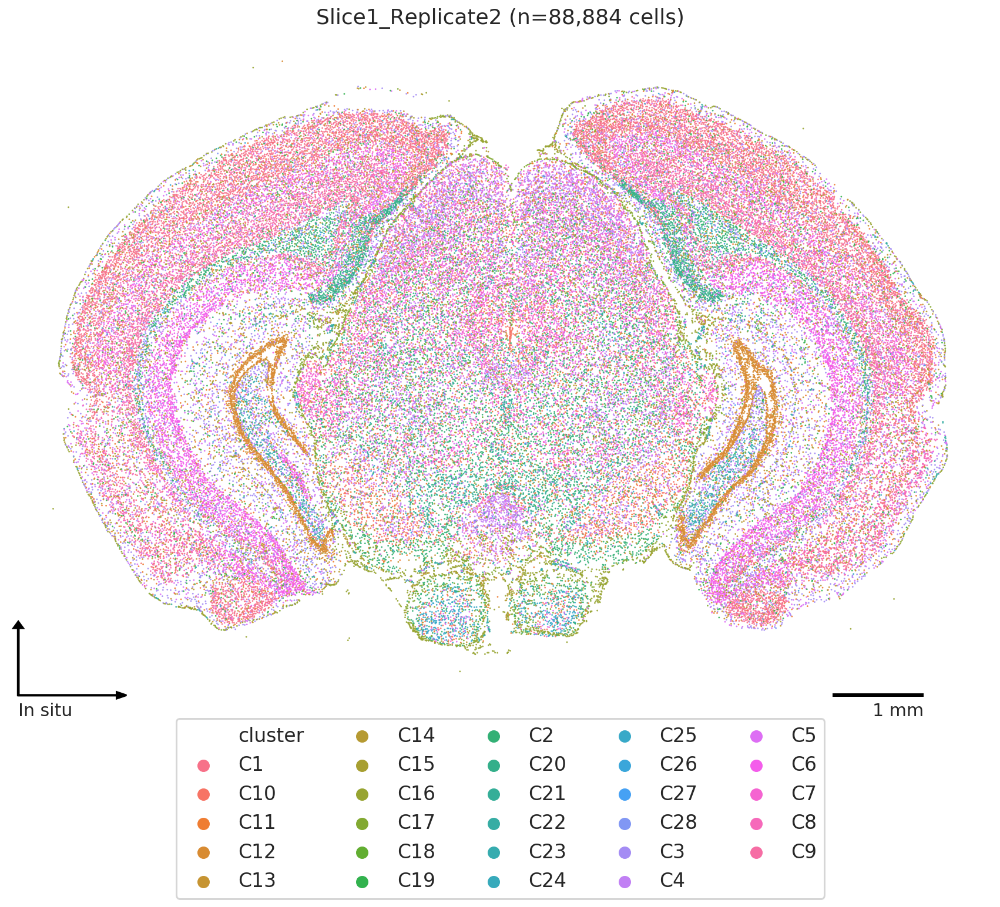

In [10]:
output1 = figures.format('in_situ_by_clusters_{}.pdf'.format(sample))
output2 = figures.format('in_situ_by_clusters_{}.png'.format(sample))

x, y, hue = 'x', 'y', 'cluster'
toplot = thedata
title = '{} (n={:,} cells)'.format(sample, len(toplot))
legend = 'full'
palette = palette_clsts
figsize = (15, 12)
fontsize = 15

fig, ax = plt.subplots(figsize=figsize)
plot_spatial_routine(ax, x, y, hue, toplot, palette, legend=legend, title=title, fontsize=fontsize)
ax.legend(bbox_to_anchor=(0.5,-0.01), loc='upper center', ncol=5)

for output in [output1, output2]:
    print(output)
    snmcseq_utils.savefig(fig, output)
    
plt.show()

../figures/2021-05-20_umap_by_clusters_Slice1_Replicate2.pdf
../figures/2021-05-20_umap_by_clusters_Slice1_Replicate2.png


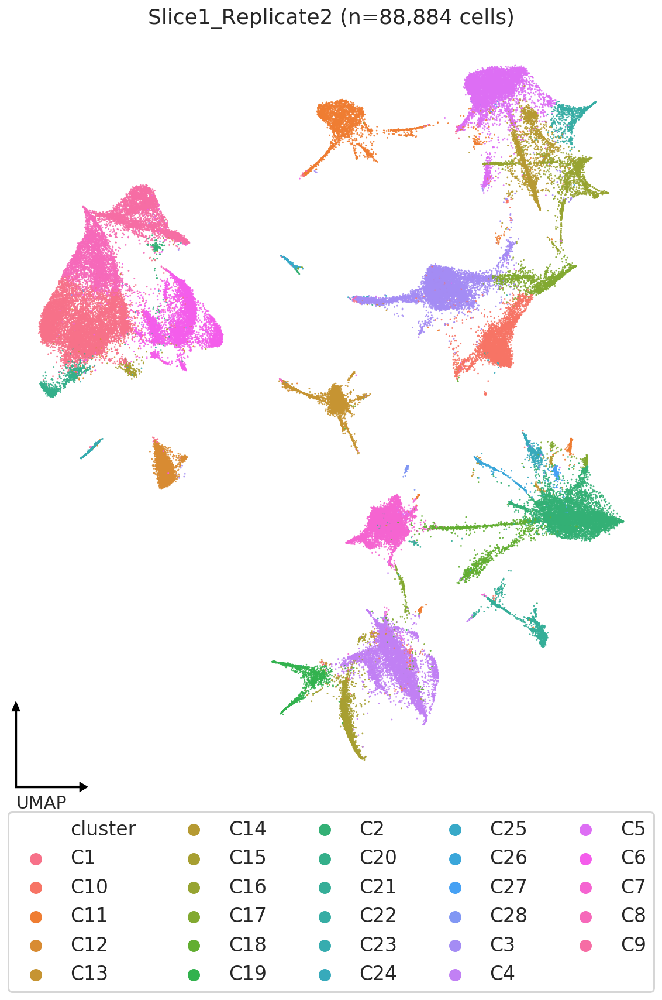

In [11]:
output1 = figures.format('umap_by_clusters_{}.pdf'.format(sample))
output2 = figures.format('umap_by_clusters_{}.png'.format(sample))

x, y, hue = 'umap_1', 'umap_2', 'cluster'
toplot = thedata
title = '{} (n={:,} cells)'.format(sample, len(toplot))
legend = 'full'
palette = palette_clsts
figsize = (10, 12)
fontsize = 15

fig, ax = plt.subplots(figsize=figsize)
plot_umap_routine(ax, x, y, hue, toplot, palette, legend=legend, title=title, fontsize=fontsize)
ax.legend(bbox_to_anchor=(0.5,-0.01), loc='upper center', ncol=5)

for output in [output1, output2]:
    print(output)
    snmcseq_utils.savefig(fig, output)
plt.show()

## visualize each cluster (downsample)

In [12]:
# subsamp

nsample = 20000
toplot_subsamp = thedata.sample(n=nsample)

print(toplot_subsamp.shape)
toplot_subsamp.head()

(20000, 497)


,cluster,umap_1,umap_2,x,y,fov,volume,center_x,center_y,min_x,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
cell,,,,,,,,,,,,,,,,,,,,,
240883553388845663800414017867472912103,C1,-8.527811,0.854721,3171.807442,-2126.258692,848,401.675288,4733.591514,8804.184637,4729.530714,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.022364
19658931393382777461511865906068725066,C1,-7.987804,1.757980,2931.679866,-2794.128204,1035,799.144188,5429.327270,8944.408370,5423.700470,...,0.0,0.002203,0.0,0.0,0.0,0.0,0.002203,0.0,0.0,0.002203
204243946560619757417591918509584549495,C15,-0.117732,-11.850646,-2886.593255,-2101.497423,1485,1117.134005,7848.181748,3607.631953,7839.746948,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.004658,0.0,0.0,0.003106
208014656086701671081003634845603904116,C1,-10.092626,1.730578,-936.351773,2263.952469,416,966.814314,3103.552769,3016.793181,3096.737969,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.005137,0.0,0.0,0.001712
84318506839236467487952664679129742624,C8,-9.745226,3.416753,-4243.153596,570.089431,1186,1523.182943,6264.441681,1064.130493,6253.738880,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.001572,0.0,0.0,0.007862


/cndd2/fangming/venvs/routine/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/cndd2/fangming/venvs/routine/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


../figures/2021-05-20_in_situ_umap_by_clusters_Slice1_Replicate2_C1.pdf
../figures/2021-05-20_in_situ_umap_by_clusters_Slice1_Replicate2_C1.png


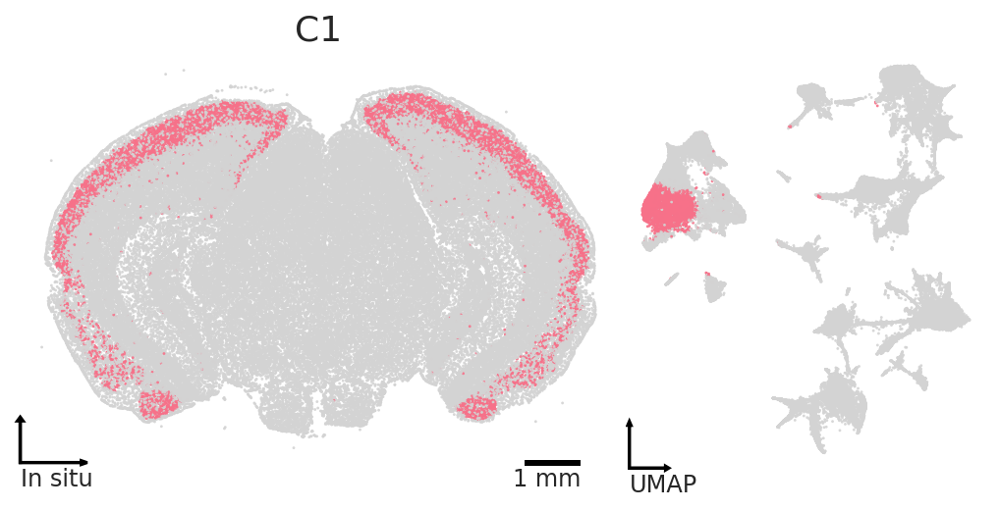

In [13]:
x_spatial, y_spatial = 'x', 'y'
x_umap, y_umap = 'umap_1', 'umap_2'
hue = 'cluster'
legend = False
fontsize = 12

# n = len(uniq_clsts)
for i, clst in enumerate(uniq_clsts):
    output1 = figures.format('in_situ_umap_by_clusters_{}_{}.pdf'.format(sample, clst))
    output2 = figures.format('in_situ_umap_by_clusters_{}_{}.png'.format(sample, clst))
    
    fig, axs_row = plt.subplots(1, 2, figsize=(5*2,4*1))
    title = '{}'.format(clst)
    palette_specific = {_clst: palette_clsts[_clst] if _clst == clst else "lightgray" 
                        for _clst in uniq_clsts} 
    ax = axs_row[0]
    plot_spatial_routine(
        ax, x_spatial, y_spatial, hue, toplot, 
        palette_specific, legend=legend, title=title, fontsize=fontsize,
    )
    ax = axs_row[1]
    plot_umap_routine(
        ax, x_umap, y_umap, hue, toplot, 
        palette_specific, legend=legend, title='', fontsize=fontsize,
    )
    fig.subplots_adjust(wspace=-0.2)
    
    for output in [output1, output2]:
        print(output)
        snmcseq_utils.savefig(fig, output)
    plt.show()
    break

In [14]:
# all in one plot

# x_spatial, y_spatial = 'x', 'y'
# x_umap, y_umap = 'umap_1', 'umap_2'
# hue = 'cluster'
# legend = False
# fontsize = 12

# n = len(uniq_clsts)

# fig, axs = plt.subplots(n, 2, figsize=(5*2,4*n))
# for i, clst in enumerate(uniq_clsts):
#     axs_row = axs[i]
#     title = '{}'.format(clst)
#     palette_specific = {_clst: palette_clsts[_clst] if _clst == clst else "lightgray" 
#                         for _clst in uniq_clsts} 
#     ax = axs_row[0]
#     plot_spatial_routine(
#         ax, x_spatial, y_spatial, hue, toplot, 
#         palette_specific, legend=legend, title=title, fontsize=fontsize,
#     )
#     ax = axs_row[1]
#     plot_umap_routine(
#         ax, x_umap, y_umap, hue, toplot, 
#         palette_specific, legend=legend, title='', fontsize=fontsize,
#     )
# fig.subplots_adjust(wspace=-0.2)
# plt.show()

In [15]:
# # generate markdown file

# output2 = figures.format('in_situ_by_clusters_{}.png'.format(sample))
# print('''<div style="page-break-after: always;"></div>''')
# print('\n')
# print('''![]({})'''.format(output2))
# print('\n')
# print('''<div style="page-break-after: always;"></div>''')
# print('\n')
# output2 = figures.format('umap_by_clusters_{}.png'.format(sample))
# print('''![]({})'''.format(output2))
# print('\n')
# print('''<div style="page-break-after: always;"></div>''')
# print('\n')
# for i, clst in enumerate(uniq_clsts):
#     output2 = figures.format('in_situ_umap_by_clusters_{}_{}.png'.format(sample, clst))
#     print('''![]({})'''.format(output2))
#     print('\n')
#     print('''<div style="page-break-after: always;"></div>''')
#     print('\n')

## hippocampus cell types and genes
- C6,9,12
- DKL1, DRD1, DRD2, FN1, HTR2C, TRHR

In [16]:
selected_group = ['C6', 'C9', 'C12']

In [17]:
curated_genes = snmcseq_utils.read_googlesheet('curated_gene_list', 'genes_organized')
print(curated_genes.shape)
curated_genes = curated_genes[curated_genes['gene_name']!='']
print(curated_genes.shape)
overlaped_genes = np.intersect1d(curated_genes['gene_name'], genes.map(lambda x: x.upper()))
curated_genes = curated_genes[curated_genes['gene_name'].isin(overlaped_genes)]
print(curated_genes.shape)

curated_genes_list = curated_genes['gene_name'].apply(lambda x: x[0]+x[1:].lower()).values

curated_genes

(65, 4)
(52, 4)
(6, 4)


,gene_name,gene_full_name,reference,present_in_vizgen_merfish?
1,FN1,Fibronectin 1,Ding et al.,Yes
16,DLK1,Delta Like Non-Canonical Notch Ligand 1,a,Yes
24,HTR2C,5-Hydroxytryptamine Receptor 2C,Dong work,Yes
35,TRHR,Thyrotropin Releasing Hormone Receptor,c,Yes
56,DRD2,Dopamine Receptor D2,i,Yes
57,DRD1,Dopamine Receptor D1,i,Yes


In [18]:
curated_genes_list

array(['Fn1', 'Dlk1', 'Htr2c', 'Trhr', 'Drd2', 'Drd1'], dtype=object)

### visualize the expression of these 6 genes across all slices

<!-- ![](../figures/2021-05-01_Fn1.png)
![](../figures/2021-05-01_Dlk1.png)
![](../figures/2021-05-01_Htr2c.png)
![](../figures/2021-05-01_Trhr.png)
![](../figures/2021-05-01_Drd1.png)
![](../figures/2021-05-01_Drd2.png) -->

## ANOVA genes

In [19]:
gmat.shape

(88884, 483)

In [20]:
ti = time.time()
tss_df = utils.anova_analysis(gmat, clsts.reindex(gmat.index)['cluster'])
tss_df['s2/mu']  = tss_df['s2']/tss_df['mu']
print(time.time()-ti)
print(tss_df.shape)
tss_df.head()

2.1613900661468506
(483, 7)


,tss,tss_in,tss_out,eta2,s2,mu,s2/mu
Oxgr1,0.058134,0.057892,0.000242,0.004158,6.540402e-07,0.000126,0.005197
Htr1a,0.841520,0.762192,0.079327,0.094266,9.467616e-06,0.000918,0.010316
Htr1b,0.603537,0.547803,0.055733,0.092345,6.790163e-06,0.000804,0.008449
Htr1d,0.089433,0.085412,0.004021,0.044960,1.006175e-06,0.000112,0.008989
Htr1f,0.371179,0.294975,0.076204,0.205303,4.175999e-06,0.000577,0.007236


In [21]:
delta = np.log2( 
    gmat.loc[clsts[clsts['cluster'].isin(selected_group)].index].mean()
   /gmat.loc[clsts[~clsts['cluster'].isin(selected_group)].index].mean()
    )
tss_df['delta'] = delta 

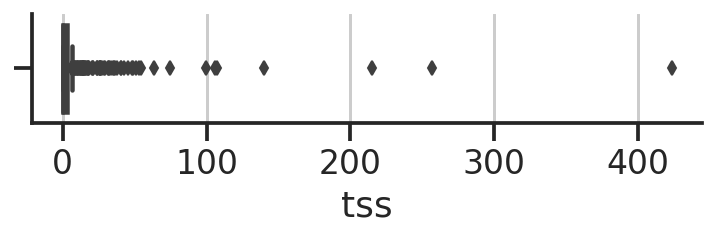

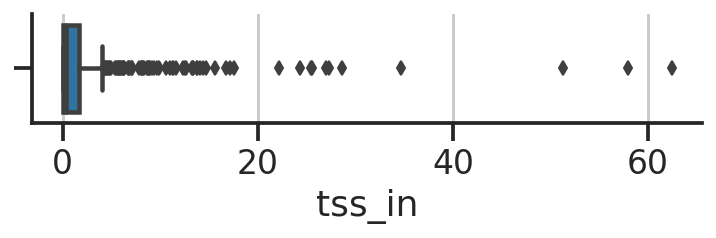

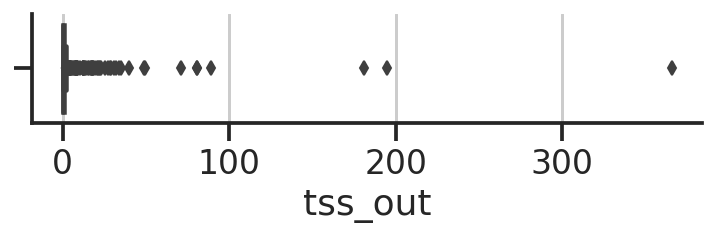

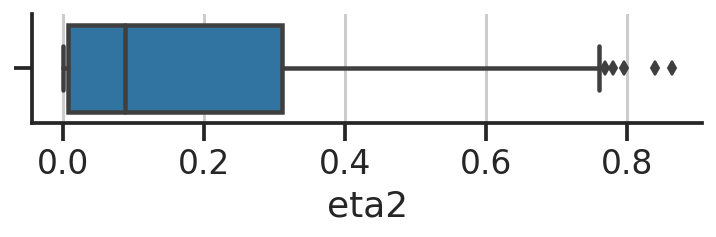

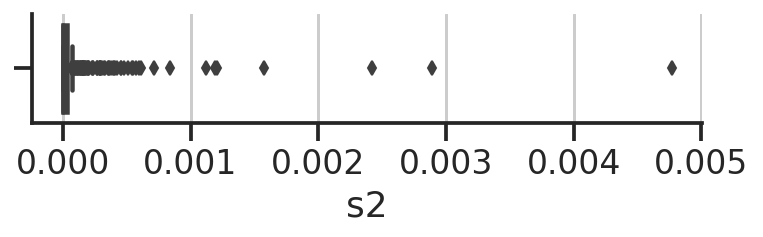

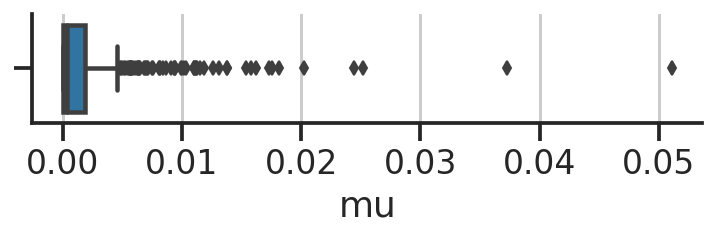

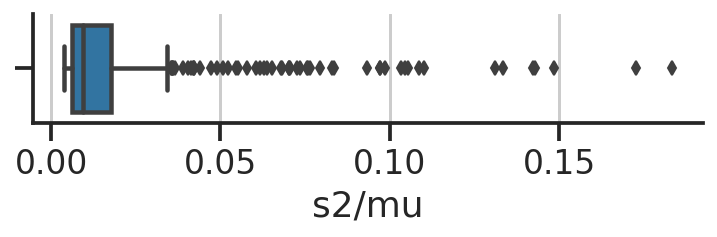

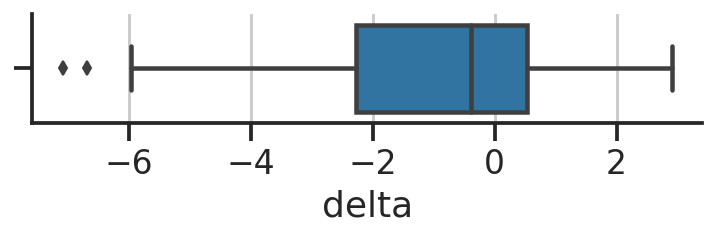

In [22]:
# 
for col in tss_df:
    fig, ax = plt.subplots(figsize=(6,1))
    sns.boxplot(tss_df[col], ax=ax)
    sns.despine(ax=ax)
    plt.show()

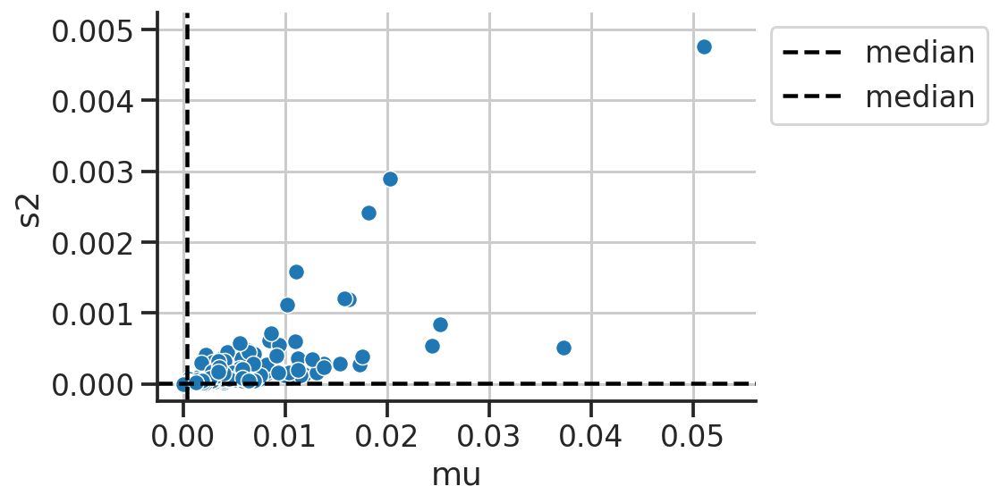

In [23]:
x, y, pdata = 'mu', 's2', tss_df
xmin, xmax = pdata[x].min(), pdata[x].max()
ymin, ymax = pdata[y].min(), pdata[y].max()
xmin, xmax = -0.05*xmax, 1.1*xmax
ymin, ymax = -0.05*ymax, 1.1*ymax

fig, ax = plt.subplots()
sns.scatterplot(x=x, y=y, data=pdata, ax=ax,)

ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')

ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
sns.despine(ax=ax)
plt.show()

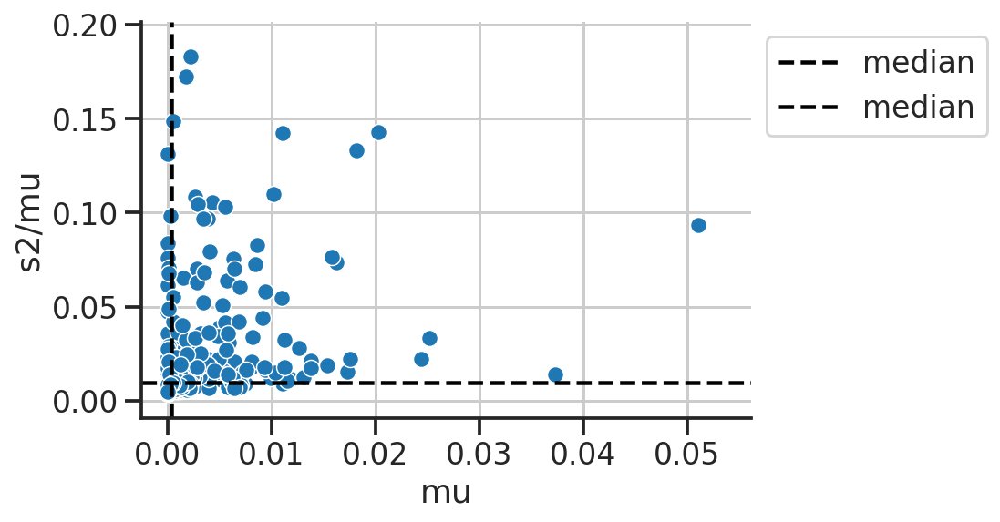

In [24]:
x, y, pdata = 'mu', 's2/mu', tss_df
xmin, xmax = pdata[x].min(), pdata[x].max()
ymin, ymax = pdata[y].min(), pdata[y].max()
xmin, xmax = -0.05*xmax, 1.1*xmax
ymin, ymax = -0.05*ymax, 1.1*ymax

fig, ax = plt.subplots()
sns.scatterplot(x=x, y=y, data=pdata, ax=ax,)
ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
sns.despine(ax=ax)
plt.show()

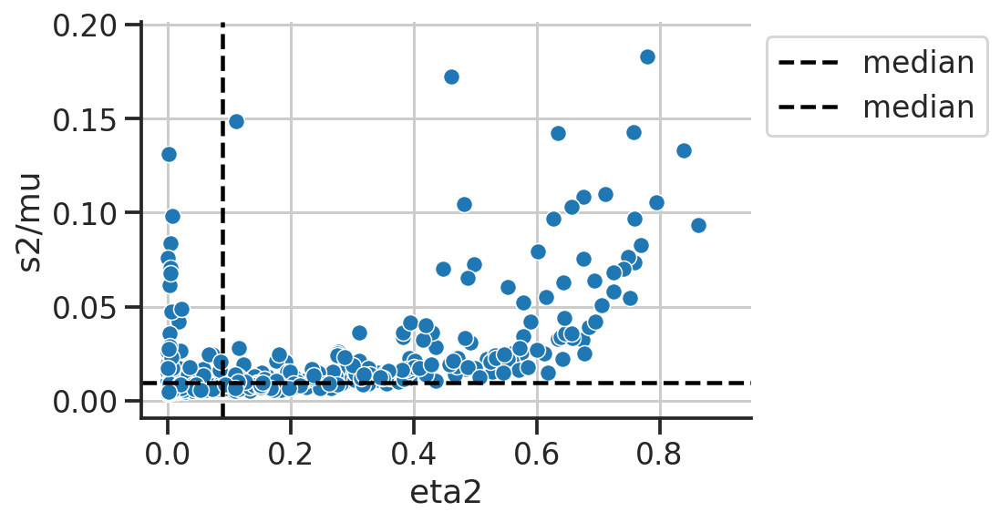

In [25]:
x, y, pdata = 'eta2', 's2/mu', tss_df
xmin, xmax = pdata[x].min(), pdata[x].max()
ymin, ymax = pdata[y].min(), pdata[y].max()
xmin, xmax = -0.05*xmax, 1.1*xmax
ymin, ymax = -0.05*ymax, 1.1*ymax

fig, ax = plt.subplots()
sns.scatterplot(x=x, y=y, data=pdata, ax=ax,)
ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
sns.despine(ax=ax)
plt.show()

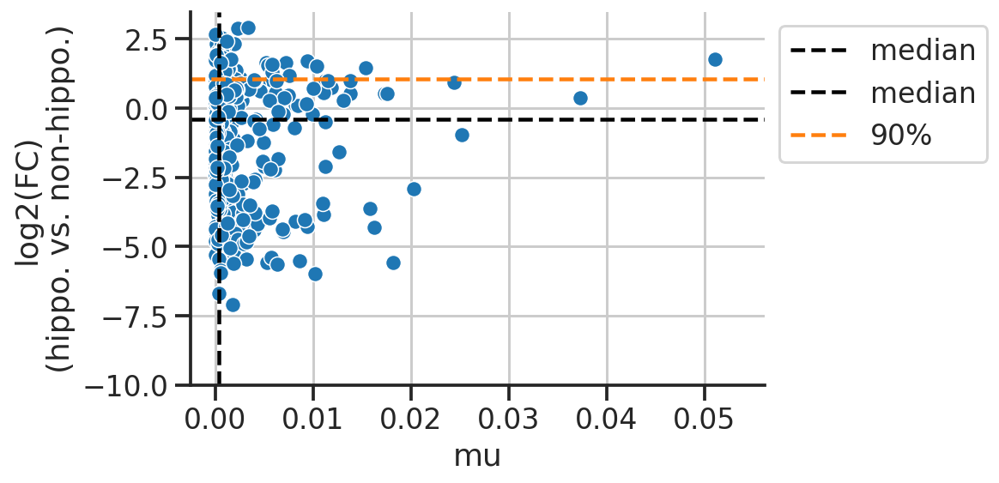

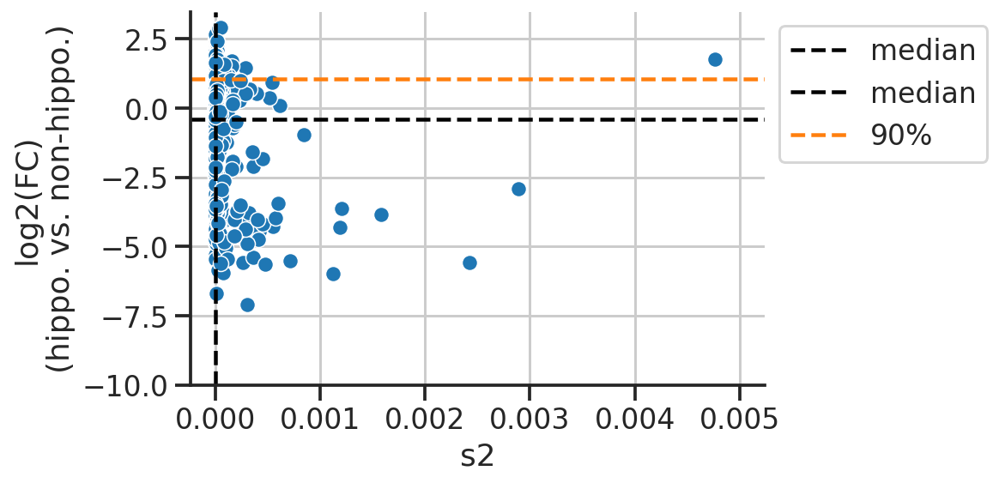

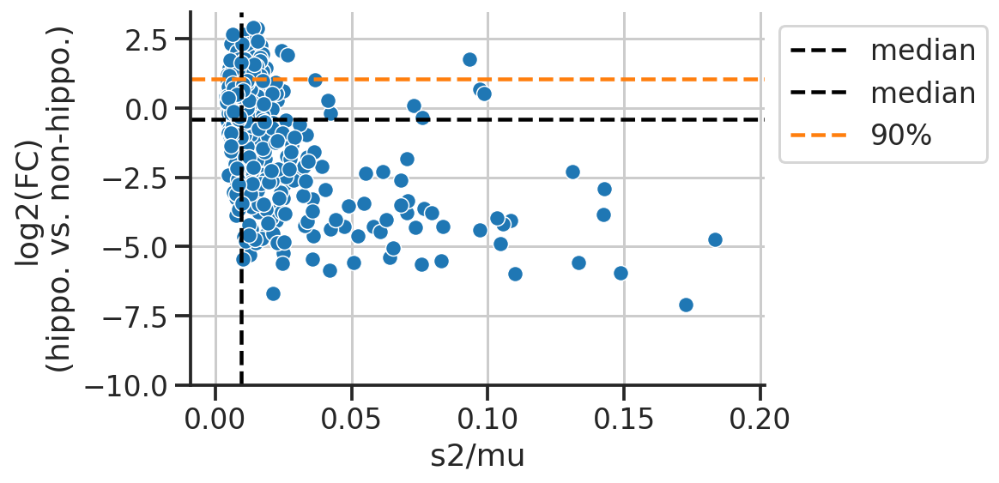

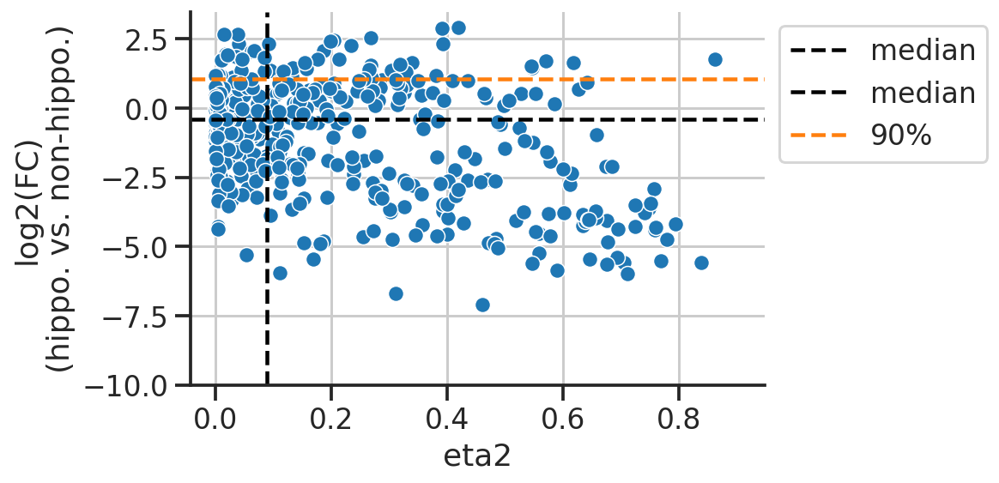

In [26]:
xs = ['mu', 's2', 's2/mu', 'eta2']
percentile_th = 90
for x in xs:
    x, y, pdata = x, 'delta', tss_df
    xmin, xmax = pdata[x].min(), pdata[x].max()
    ymin, ymax = pdata[y].min(), pdata[y].max()
    xmin, xmax = -0.05*xmax, 1.1*xmax
    ymin, ymax = -10, 1.2*ymax

    fig, ax = plt.subplots()
    sns.scatterplot(x=x, y=y, data=pdata, ax=ax,)
    ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
#     ax.axvline(np.percentile(pdata[x], percentile_th), color='C1', linestyle='--', label='{}%'.format(percentile_th))
    ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')
    ax.axhline(np.percentile(pdata[y], percentile_th), color='C1', linestyle='--', label='{}%'.format(percentile_th))
    
    ax.legend(bbox_to_anchor=(1,1), loc='upper left')
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    
    ax.set_ylabel('log2(FC)\n(hippo. vs. non-hippo.)')
    sns.despine(ax=ax)
    plt.show()

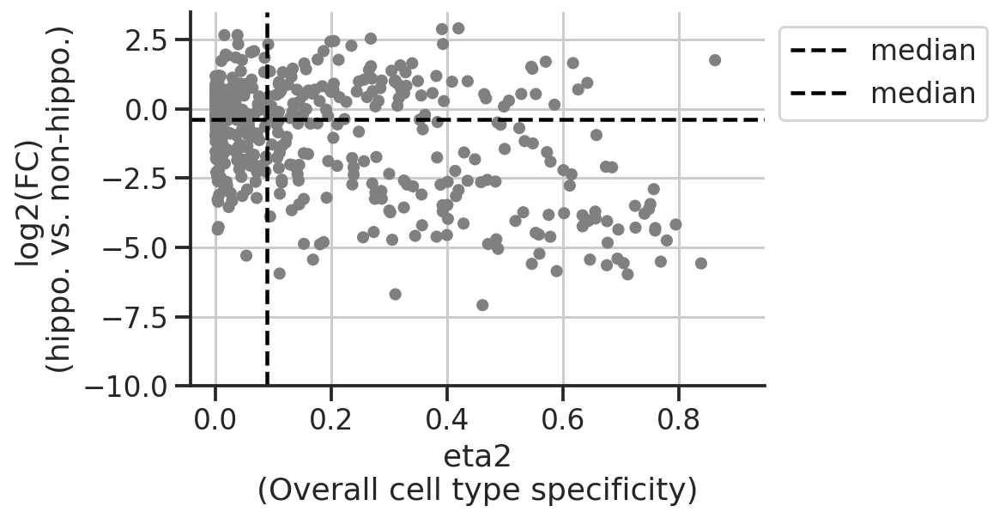

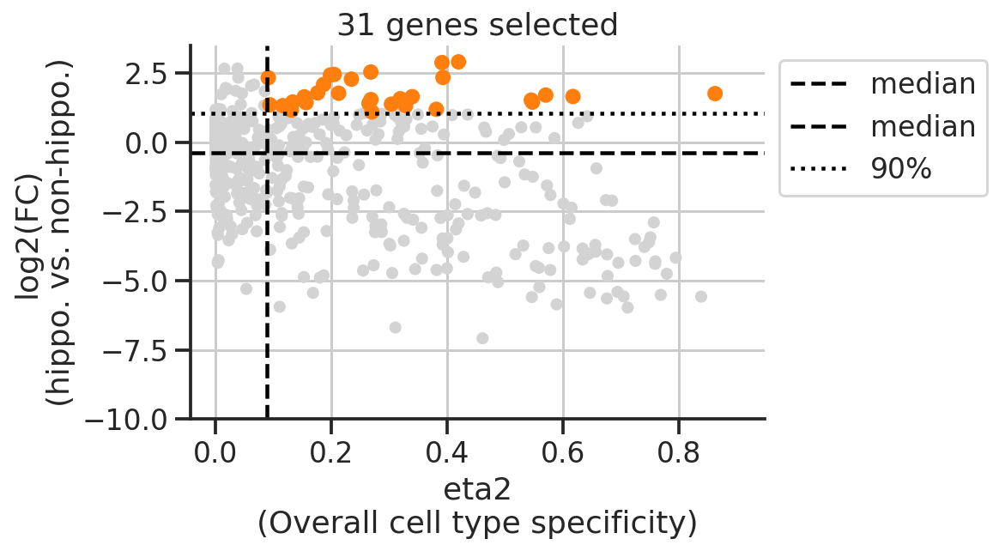

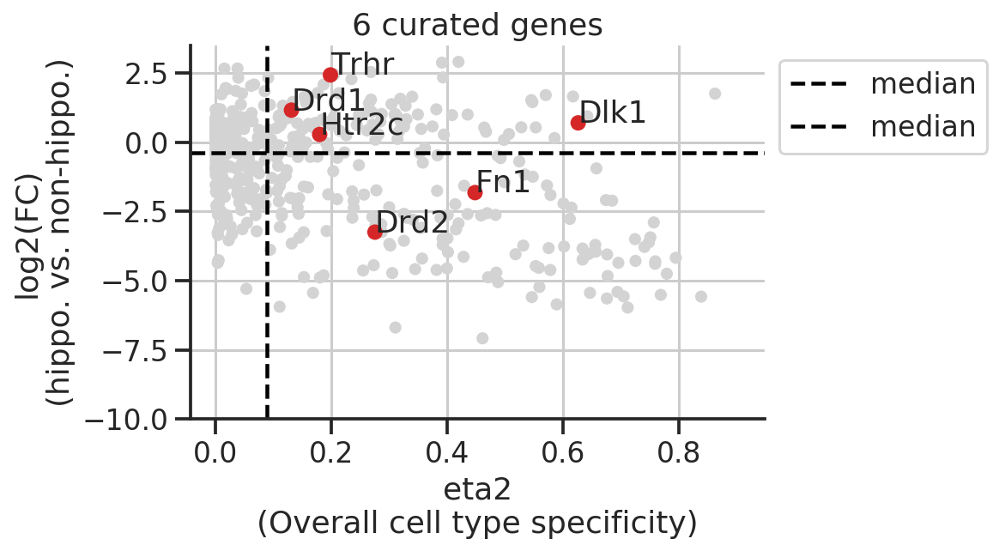

In [27]:
layers = [0,1,2]

percentile_th = 90
x, y, pdata = 'eta2', 'delta', tss_df
xmin, xmax = pdata[x].min(), pdata[x].max()
ymin, ymax = pdata[y].min(), pdata[y].max()
xmin, xmax = -0.05*xmax, 1.1*xmax
ymin, ymax = -10, 1.2*ymax


for layer in layers:
    fig, ax = plt.subplots()
    
    color = 'gray'
    if layer > 0:
        color = 'lightgray'
        
    sns.scatterplot(x=x, y=y, data=pdata, ax=ax, color=color, edgecolor='none', s=50)
    ax.axvline(pdata[x].median(), color='k', linestyle='--', label='median')
    ax.axhline(pdata[y].median(), color='k', linestyle='--', label='median')

    if layer == 1:
        cutoffy = np.percentile(pdata[y], percentile_th)
        cutoffx = np.percentile(pdata[x], 50)
        ax.axhline(cutoffy, color='k', linestyle='dotted', label='{}%'.format(percentile_th))
        pdata_selected = pdata[((pdata[y]>cutoffy) & (pdata[x]>cutoffx))]
        sns.scatterplot(x=x, y=y, data=pdata_selected, ax=ax, color='C1', zorder=2, edgecolor='none')
        ax.set_title('{} genes selected'.format(len(pdata_selected)))
    if layer == 2:
        pdata_curated = pdata.loc[curated_genes_list]
        sns.scatterplot(x=x, y=y, data=pdata_curated, ax=ax, color='C3', zorder=2, edgecolor='none')
        ax.set_title('{} curated genes'.format(len(pdata_curated)))
        for gene_name, row in pdata_curated.iterrows():
            ax.text(row[x], row[y], gene_name)
        
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    ax.legend(bbox_to_anchor=(1,1), loc='upper left')

    ax.set_xlabel('eta2\n(Overall cell type specificity)')
    ax.set_ylabel('log2(FC)\n(hippo. vs. non-hippo.)')
    sns.despine(ax=ax)
    plt.show()

In [28]:
prioritized_genes = np.sort(pdata_selected.index.values)
print(prioritized_genes, len(prioritized_genes))

['Adgra1' 'Adra1d' 'Baiap2' 'Celsr3' 'Chrm1' 'Chrm4' 'Drd1' 'Epha6'
 'Epha7' 'Glp2r' 'Gpr161' 'Gpr22' 'Gpr26' 'Grin2b' 'Grm2' 'Grm5' 'Htr1a'
 'Htr1f' 'Htr4' 'Mas1' 'Mc4r' 'Mchr1' 'Npy2r' 'Nrp1' 'Ror1' 'Rspo3'
 'Slc17a7' 'Sstr2' 'Sstr3' 'Sstr4' 'Trhr'] 31


In [29]:
np.intersect1d(curated_genes_list, prioritized_genes)

array(['Drd1', 'Trhr'], dtype=object)

## Visualize genes
- boxplot + UMAP + spatial

In [30]:
curated_genes_list

array(['Fn1', 'Dlk1', 'Htr2c', 'Trhr', 'Drd2', 'Drd1'], dtype=object)

../figures/2021-05-20_gene_view_Slice1_Replicate2_Epha7.pdf
../figures/2021-05-20_gene_view_Slice1_Replicate2_Epha7.png


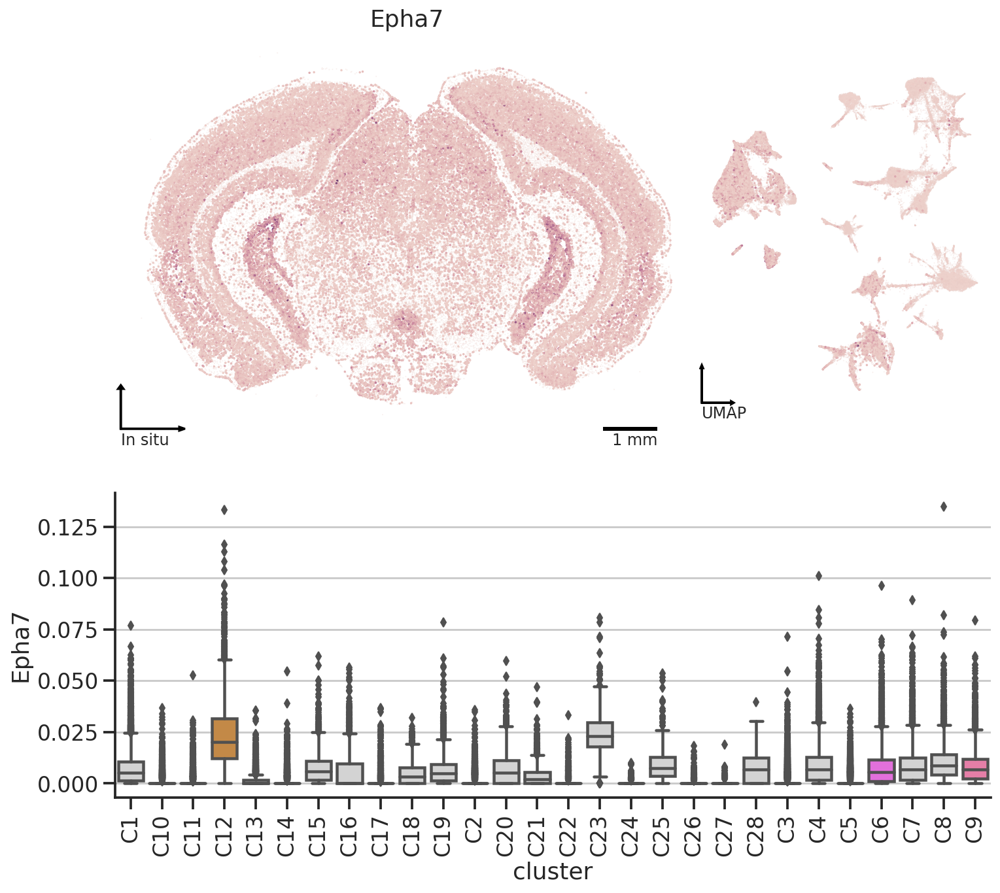

../figures/2021-05-20_gene_view_Slice1_Replicate2_Epha8.pdf
../figures/2021-05-20_gene_view_Slice1_Replicate2_Epha8.png


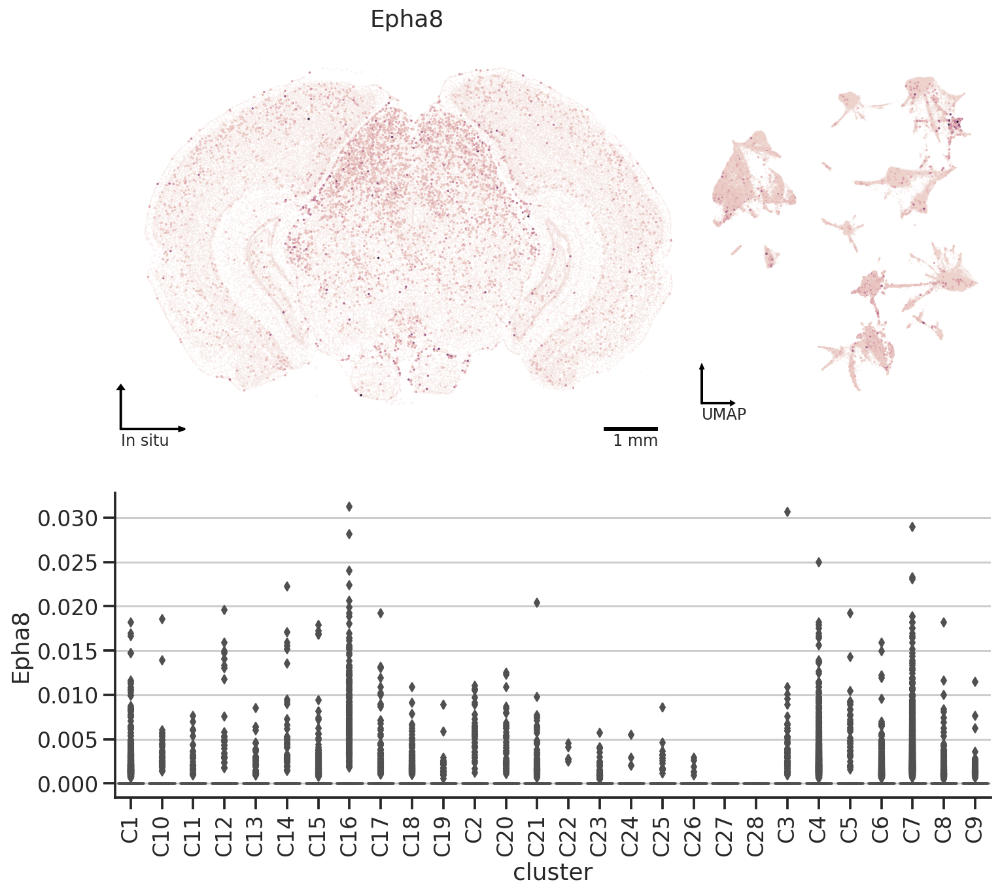

../figures/2021-05-20_gene_view_Slice1_Replicate2_Gpr161.pdf
../figures/2021-05-20_gene_view_Slice1_Replicate2_Gpr161.png


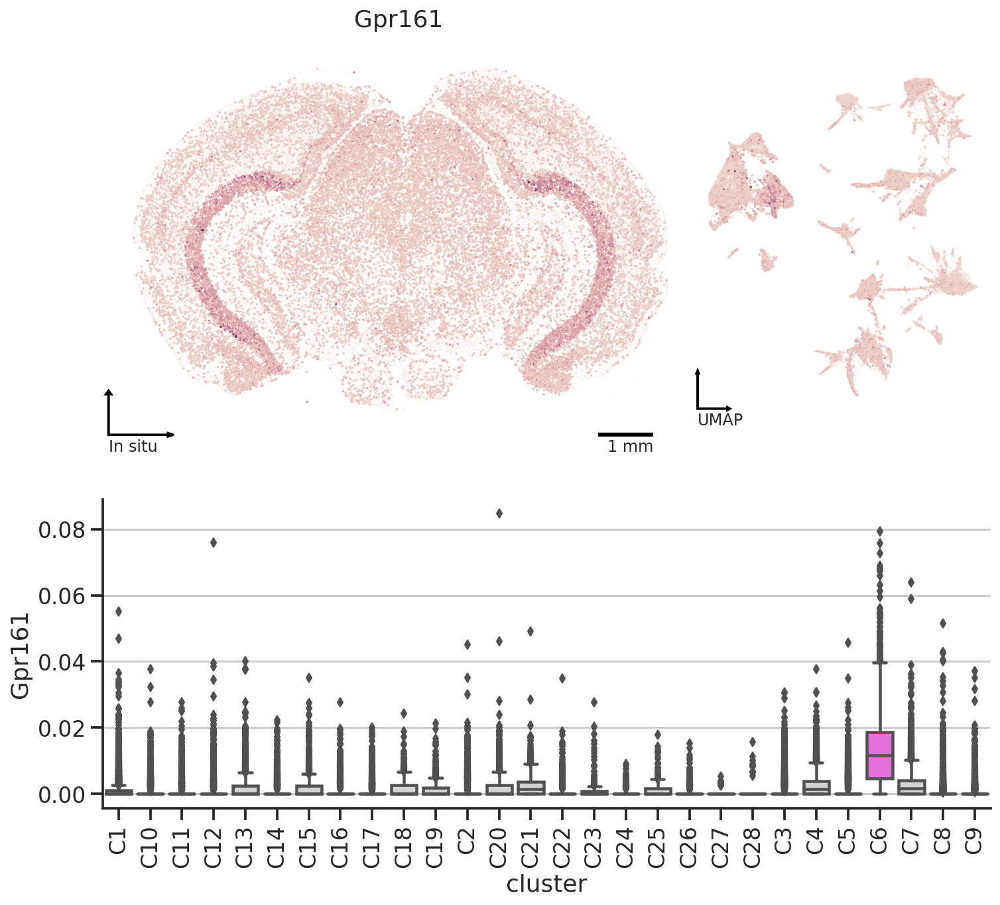

../figures/2021-05-20_gene_view_Slice1_Replicate2_Trhr.pdf
../figures/2021-05-20_gene_view_Slice1_Replicate2_Trhr.png


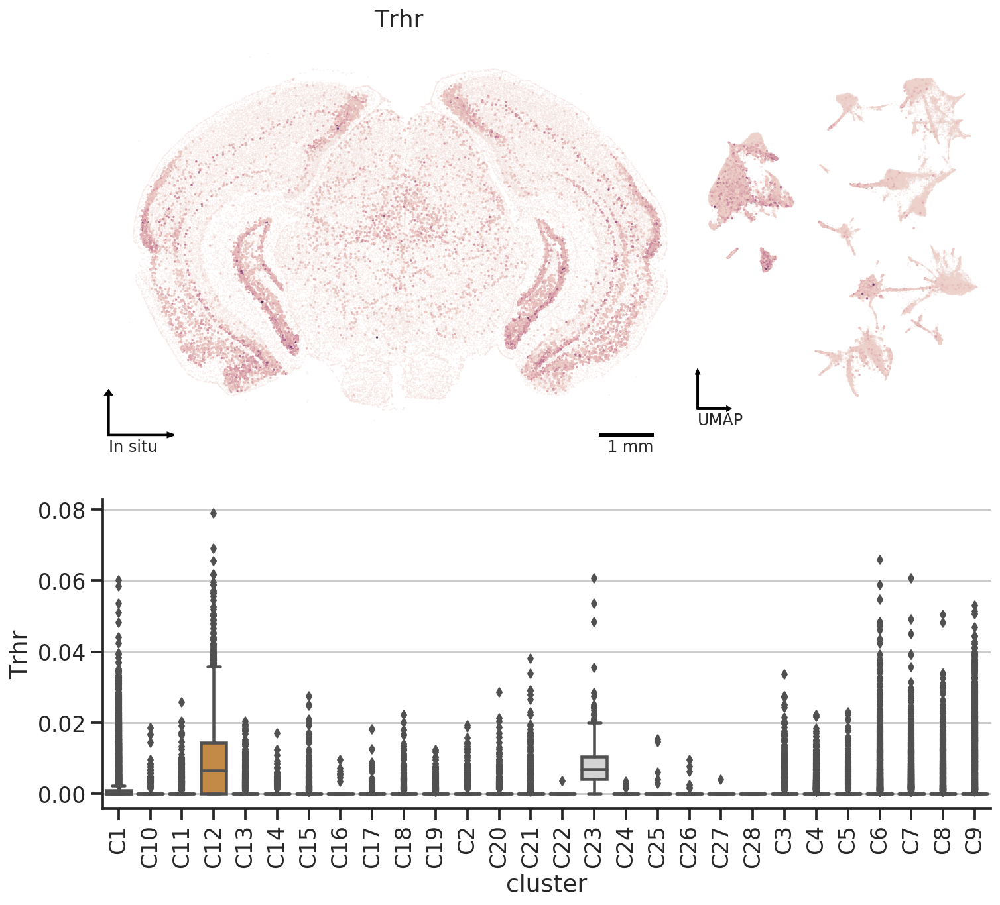

In [34]:
# gene_list = np.hstack([prioritized_genes, curated_genes_list])
gene_list = ['Epha7', 'Epha8', 'Gpr161', 'Trhr']
for gene in gene_list:
    palette_specific = {_clst: palette_clsts[_clst] if _clst in selected_group else "lightgray" 
                            for _clst in uniq_clsts} 
    toplot = thedata
    x_spatial, y_spatial = 'x', 'y'
    x_umap, y_umap = 'umap_1', 'umap_2'
    hue = gene
    fontsize = 12
    x_box, y_box = 'cluster', gene
    vmaxp = 95
    pth = 90
    
    fig = plt.figure(figsize=(12,12))
    specs = gridspec.GridSpec(nrows=3, ncols=3)
    
    # in-situ
    ax = fig.add_subplot(specs[:2,:2])  
    title = gene
    plot_continuous_spatial_routine(
        ax, x_spatial, y_spatial, hue, toplot, 
        vmaxp=vmaxp,
        title=title, fontsize=fontsize,
    )
    
    # UMAP 
    ax = fig.add_subplot(specs[:2,2])  
    plot_continuous_umap_routine(
        ax, x_umap, y_umap, hue, toplot, 
        vmaxp=vmaxp,
        title='', fontsize=fontsize,
        pth=pth,
    )
    
    # boxplot
    ax = fig.add_subplot(specs[2,:])  
    sns.boxplot(x=x_box, y=y_box, data=toplot, 
                ax=ax, 
                palette=palette_specific, 
                order=np.sort(toplot[x_box].unique()),
               )
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    sns.despine(ax=ax)
    
    fig.subplots_adjust(wspace=0, hspace=-0.1)
    
    output1 = figures.format('gene_view_{}_{}.pdf'.format(sample, gene))
    output2 = figures.format('gene_view_{}_{}.png'.format(sample, gene))
    for output in [output1, output2]:
        print(output)
        snmcseq_utils.savefig(fig, output)
    plt.show()
    
    
    

In [32]:
# group cell level into clsuter level
gmat_group = gmat.join(clsts['cluster']).groupby('cluster').mean()
# zscore per gene
gmat_group = (gmat_group - gmat_group.mean())/gmat_group.std()

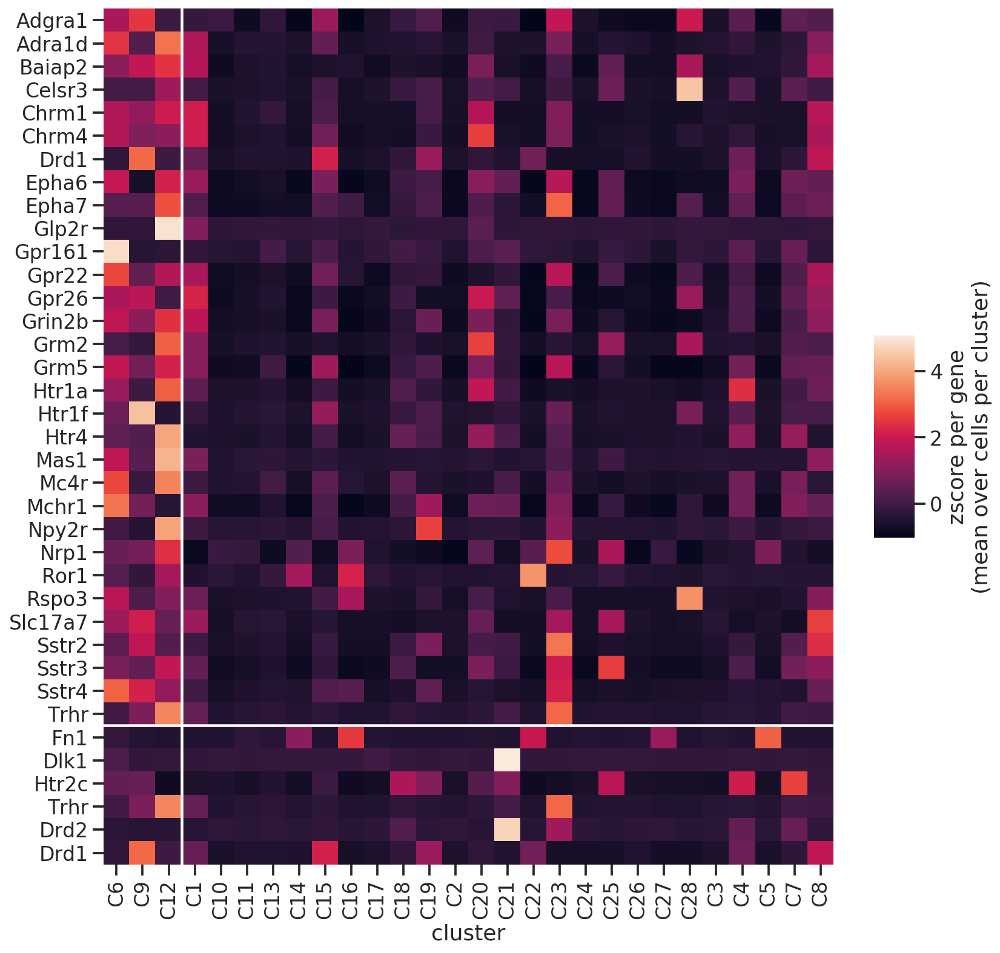

In [33]:

heatmap = gmat_group[np.hstack([prioritized_genes, curated_genes_list])].T

cols = heatmap.columns
cols = np.hstack([selected_group, cols.drop(selected_group)])
heatmap = heatmap[cols]

cbar_kws = DEFAULT_COLORBAR_KWS.copy()
cbar_kws['label'] = 'zscore per gene\n(mean over cells per cluster)'

fig, ax = plt.subplots(figsize=(12, 13))
sns.heatmap(heatmap, ax=ax, cbar_kws=cbar_kws)
ax.axhline(len(prioritized_genes), color='white')
ax.axvline(len(selected_group), color='white')
plt.show()